# Understanding GDP: A Data-Driven Exploration
GDP Predictor Project by Yarden Tamam and Kfir

Introduction

Economic stability and growth are crucial factors for the well-being of any nation. A robust gross domestic Product (GDP) is often indicative of a healthy economy, leading to improved living standards, increased employment opportunities and enhanced infrastructure development. Moreover, a thriving economy can enable a government to allocate resources effectively for the welfare of it citizens, from healthcare and education to social programs and public services. Predicting a country's GDP is therefore a fundamental area of research, as it can provide valuable insights into the economic health and prospects of a nation.

Our project focuses on the prediction of a country’s GDP based on historical time series data. by developing an accurate predictive model, we aim to contribute to the understanding of the intricate factors that influence a country's economic growth. This knowledge can be invaluable for governments, policymakers, investors and economists alike, as it allows for more informed decision-making in economic planning, resources allocation and investment strategies.

Furthermore, accurate GDP prediction has wide-ranging implications. it can assist in identifying potential economic challenges, enabling proactive measures to mitigate downturns and economic crises. Additionally, it can aid international organizations and financial institutions in assessing a country’s creditworthiness and economic stability, which in turn can influence lending rates and investment decisions.

In summary, our project seeks to harness the power of data science and time series analysis to predict a country’s GDP accurately. By doing so, we hope to contribute to the field of economics, provide valuable tools for decision makers and enhance our understanding of the complex dynamics that drive economic growth on a national scale.



Exploratory Data Analysis

in this project we will work with a dataset set we combined from a lot of datasets with features we tought could impact the GDP preformence of a country. The dataset is from ourworldindata.org. it is a time series data of all the countries in the world. the features are: Entity, code, Year, GDP per capital, cantril lader score (for a measurments of happiness) , Population density, Population, Median age, Fertility rate, sex-ratio, Meat ,consumption, Urban population, Age standardized suicide rate - Sex: both sexes, Under-five mortality rate, Electoral democracy index, Unemployment, Literacy rates, health expenditure, Region. most of the data is numerical and some catagories are represented as text. we also create some features using NLP tools and patterns recognition through the feature extraction and feature engingerr stage of the project.

In [ ]:
import nltk
import nltk
import re
from itertools import product
import requests
import spacy
import json
from tabulate import tabulate
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import shap
import warnings
import fastbook
import networkx as nx
from fastbook import *
from fastai.tabular.all import *
from fastai.basics import *
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
#from transformers import pipeline
from itertools import combinations
from textblob import TextBlob
from numpy.linalg import norm
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from Levenshtein import distance

from sklearn.cluster import KMeans, SpectralClustering, DBSCAN
from sklearn.metrics import (
    silhouette_samples,
    silhouette_score,
    classification_report,
    confusion_matrix,
    f1_score,
)
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    KFold,
    cross_val_score,
    GridSearchCV,
)
from sklearn import metrics
from sklearn.neighbors import NearestNeighbors,KNeighborsClassifier,KNeighborsRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

In [ ]:
!pip install xlrd

In [87]:
health_expenditure = pd.read_csv("/content/drive/MyDrive/python project/annual-healthcare-expenditure-per-capita.csv")
Fertility_rate = pd.read_csv("/content/drive/MyDrive/python project/children-per-woman-UN.csv")
Literacy_rates = pd.read_csv("/content/drive/MyDrive/python project/cross-country-literacy-rates.csv")
GDP_per_capita_growth_annual = pd.read_csv("/content/drive/MyDrive/python project/gdp-per-capita-growth.csv")
Meat_consumption = pd.read_csv("/content/drive/MyDrive/python project/meatconsumption.csv")
Cantril_ladder_score = pd.read_csv("/content/drive/MyDrive/python project/happiness-cantril-ladder.csv")
Population_density = pd.read_csv("/content/drive/MyDrive/python project/Populationdensity.csv")
Population = pd.read_csv("/content/drive/MyDrive/python project/population.csv")
Median_age = pd.read_csv("/content/drive/MyDrive/python project/median-age.csv")
Sex_ratio = pd.read_csv("/content/drive/MyDrive/python project/sex-ratio-at-birth.csv")
Urban_population = pd.read_csv("/content/drive/MyDrive/python project/urban-and-rural-population.csv")
suicide_rate = pd.read_csv("/content/drive/MyDrive/python project/death-rate-from-suicides-gho.csv")
Under_five_mortality_rate = pd.read_csv("/content/drive/MyDrive/python project/child-mortality-gdp-per-capita.csv")
Electoral_democracy_index = pd.read_csv("/content/drive/MyDrive/python project/distribution-electoral-democracy-index-vdem.csv")
Unemployment = pd.read_csv("/content/drive/MyDrive/python project/unemployment-rate.csv")
Literacy_rates = pd.read_csv("/content/drive/MyDrive/python project/cross-country-literacy-rates.csv")
GDP_per_capita_2018 = pd.read_csv("/content/drive/MyDrive/python project/gdp-per-capita-untill2018.csv")
GDP_per_capita_2021 = pd.read_csv("/content/drive/MyDrive/python project/gdp-per-capita-worldbankuntil2021.csv")
Continent =  pd.read_csv("/content/drive/MyDrive/python project/continents-according-to-our-world-in-data.csv")
share_employment_agriculture_industry_services = pd.read_csv("/content/drive/MyDrive/python project/share-employment-agriculture-industry-services.csv")
share_of_the_world_population_with_at_least_basic_education = pd.read_csv("/content/drive/MyDrive/python project/share-of-the-world-population-with-at-least-basic-education.csv")
world_data_gdp =  pd.read_excel("/content/drive/MyDrive/python project/worlddatagdp.xls")


In [88]:
# Assuming world_data_gdp is your original DataFrame

# Rename the 'Data Source' column to 'Entity'
world_data_gdp.rename(columns={'Data Source': 'Entity'}, inplace=True)

# Verify the first few rows before dropping
print("Before dropping rows:")
print(world_data_gdp.head())

# Drop the first 3 rows from the DataFrame
world_data_gdp = world_data_gdp.drop(world_data_gdp.index[0:3])

# Verify the first few rows after dropping
print("After dropping rows:")
print(world_data_gdp.head())

# Drop the 'World Development Indicators' column if it exists
if 'World Development Indicators' in world_data_gdp.columns:
    world_data_gdp.drop(columns=['World Development Indicators'], inplace=True)

# Convert all column names to string type
world_data_gdp.columns = world_data_gdp.columns.map(str)

# Correctly set the range for renaming columns to years 1960 through 2022
for i in range(4, 67):  # 'Unnamed: 4' (1960) to 'Unnamed: 66' (2022)
    world_data_gdp.rename(columns={f'Unnamed: {i}': str(1960 + i - 4)}, inplace=True)

# Melt the DataFrame to get 'Year' and 'GDP per capita' columns
world_data_gdp_melted = world_data_gdp.melt(id_vars=['Entity'], var_name='Year', value_name='GDP_per_capita')

# Sort the DataFrame by 'Entity' and 'Year'
world_data_gdp_melted.sort_values(by=['Entity', 'Year'], inplace=True)

# Print unique entities to check which ones are present
world_data_gdp_melted[world_data_gdp_melted['Entity'] == 'Zimbabwe']

Before dropping rows:
                        Entity World Development Indicators  \
0            Last Updated Date          2023-12-18 00:00:00   
1                          NaN                          NaN   
2                 Country Name                 Country Code   
3                        Aruba                          ABW   
4  Africa Eastern and Southern                          AFE   

                     Unnamed: 2      Unnamed: 3   Unnamed: 4   Unnamed: 5  \
0                           NaN             NaN          NaN          NaN   
1                           NaN             NaN          NaN          NaN   
2                Indicator Name  Indicator Code  1960.000000  1961.000000   
3  GDP per capita (current US$)  NY.GDP.PCAP.CD          NaN          NaN   
4  GDP per capita (current US$)  NY.GDP.PCAP.CD   141.385955   144.342434   

    Unnamed: 6  Unnamed: 7   Unnamed: 8   Unnamed: 9  Unnamed: 10  \
0          NaN         NaN          NaN          NaN          NaN  

,Entity,Year,GDP_per_capita
797,Zimbabwe,1960,276.643363
1063,Zimbabwe,1961,279.332656
1329,Zimbabwe,1962,275.966139
1595,Zimbabwe,1963,277.532515
1861,Zimbabwe,1964,282.376856
...,...,...,...
16757,Zimbabwe,2020,1372.696674
17023,Zimbabwe,2021,1773.920411
17289,Zimbabwe,2022,1676.821489
265,Zimbabwe,Unnamed: 2,GDP per capita (current US$)


In [89]:
GDP_per_capita_2018['GDP_per_capita']=GDP_per_capita_2018['GDP per capita']
GDP_per_capita_2021['GDP_per_capita']=GDP_per_capita_2021['GDP per capita']
GDP_per_capita_2021.head(5)

,Entity,Code,Year,GDP per capita,"PPP (constant 2017 international $)""",GDP_per_capita
0,Afghanistan,AFG,2002,1280.4631,NaN,1280.4631
1,Afghanistan,AFG,2003,1292.3335,NaN,1292.3335
2,Afghanistan,AFG,2004,1260.0605,NaN,1260.0605
3,Afghanistan,AFG,2005,1352.3207,NaN,1352.3207
4,Afghanistan,AFG,2006,1366.9932,NaN,1366.9932


In [90]:
GDP_per_capita = pd.merge(
    GDP_per_capita_2021[['Entity', 'Year', 'GDP_per_capita']],
    GDP_per_capita_2018[['Entity', 'Year', 'GDP_per_capita']],
    on=['Entity', 'Year'],
    how='outer'
)

GDP_per_capita['GDP_per_capita'] = GDP_per_capita.apply(
   lambda row: row['GDP_per_capita_x'] if pd.notnull(row['GDP_per_capita_x']) and pd.isnull(row['GDP_per_capita_y'])
    else row['GDP_per_capita_y'] if pd.notnull(row['GDP_per_capita_y']) and pd.isnull(row['GDP_per_capita_x'])
    else (row['GDP_per_capita_x'] + row['GDP_per_capita_y']) / 2 if pd.notnull(row['GDP_per_capita_x']) and pd.notnull(row['GDP_per_capita_y'])
    else None,
    axis=1
)

GDP_per_capita.drop(['GDP_per_capita_x', 'GDP_per_capita_y'], axis=1, inplace=True)

In [91]:
from itertools import product

In [92]:
GDP_per_capita.columns

Index(['Entity', 'Year', 'GDP_per_capita'], dtype='object')

In [93]:
countries = ['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi', "Cote d'Ivoire", 'Cape Verde', 'Cambodia', 'Cameroon', 'Canada', 'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus', 'Czech Republic', 'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Grenada', 'Guatemala', 'Guinea', 'Guinea-Bissau', 'Guyana', 'Haiti', 'Honduras', 'Holy See', 'Hungary','hong kong', 'Iceland', 'India', 'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy', 'Jamaica', 'Japan', 'Jordan', 'Kazakhstan', 'Kenya', 'Kiribati', 'Kuwait', 'Kyrgyzstan', 'Laos', 'Latvia', 'Lebanon', 'Lesotho', 'Liberia', 'Libya', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Madagascar', 'Malawi', 'Malaysia', 'Maldives', 'Mali', 'Malta', 'Marshall Islands', 'Mauritania', 'Mauritius', 'Mexico', 'Micronesia', 'Moldova', 'Monaco', 'Mongolia', 'Montenegro', 'Morocco', 'Mozambique', 'Myanmar', 'Namibia', 'Nauru', 'Nepal', 'Netherlands', 'New Zealand', 'Nicaragua', 'Niger', 'Nigeria', 'North Korea', 'North Macedonia', 'Norway', 'Oman', 'Pakistan', 'Palau', 'Panama', 'Papua New Guinea', 'Paraguay', 'Peru', 'Philippines', 'Poland', 'Portugal', 'Qatar', 'Romania', 'Russia', 'Rwanda', 'Saint Kitts and Nevis', 'Saint Lucia', 'Saint Vincent and the Grenadines', 'Samoa', 'San Marino', 'Sao Tome and Principe', 'Saudi Arabia', 'Senegal', 'Serbia', 'Seychelles', 'Sierra Leone', 'Singapore', 'Slovakia', 'Slovenia', 'Solomon Islands', 'Somalia', 'South Africa', 'South Korea', 'South Sudan', 'Spain', 'Sri Lanka', 'Sudan', 'Suriname', 'Sweden', 'Switzerland', 'Syria', 'Tajikistan', 'Tanzania', 'Thailand', 'Timor-Leste', 'Togo', 'Tonga', 'Trinidad and Tobago', 'Tunisia', 'Turkey', 'Turkmenistan', 'Tuvalu', 'Uganda', 'Ukraine', 'United Arab Emirates', 'United Kingdom', 'United States', 'Uruguay', 'Uzbekistan', 'Vanuatu', 'Venezuela', 'Vietnam', 'Yemen', 'Zambia', 'Zimbabwe']
dataframe_names = [
    'GDP_per_capita', 'health_expenditure', 'Fertility_rate','Literacy_rates','GDP_per_capita_growth_annual','Meat_consumption', 'Cantril_ladder_score', 'Population_density', 'Population', 'Median_age',
    'Sex_ratio', 'Urban_population', 'suicide_rate', 'Under_five_mortality_rate',
    'Electoral_democracy_index', 'Unemployment'
]
Data_Frames = [GDP_per_capita, health_expenditure, Fertility_rate, Literacy_rates, GDP_per_capita_growth_annual, Meat_consumption, Cantril_ladder_score, Population_density, Population, Median_age, Sex_ratio, Urban_population, suicide_rate, Under_five_mortality_rate, Electoral_democracy_index, Unemployment, Literacy_rates]
all_combinations = list(product(countries, range(1950, 2024)))
merged_df = pd.DataFrame(all_combinations, columns=['Entity', 'Year'])

merged_df = pd.merge(merged_df, Continent[['Entity', 'Continent']], on='Entity', how='left')
merged_df.to_csv('merged_data.csv', index=False)
merged_df

,Entity,Year,Continent
0,Afghanistan,1950,Asia
1,Afghanistan,1951,Asia
2,Afghanistan,1952,Asia
3,Afghanistan,1953,Asia
4,Afghanistan,1954,Asia
...,...,...,...
14425,Zimbabwe,2019,Africa
14426,Zimbabwe,2020,Africa
14427,Zimbabwe,2021,Africa
14428,Zimbabwe,2022,Africa


In [94]:
null_gdp_continent_rows = merged_df[merged_df['Continent'].isnull()]
unique_countries = null_gdp_continent_rows['Entity'].unique()
countries_to_delete = ['Holy See']
merged_df = merged_df[~merged_df['Entity'].isin(countries_to_delete)].copy()
countries_to_map = {
    'Czech Republic': 'Europe',
    'Hong Kong': 'Asia',
    'Micronesia': 'Oceania',
    'Timor-Leste': 'Asia'
}
merged_df.loc[merged_df['Entity'].isin(countries_to_map.keys()), 'Continent'] = merged_df['Entity'].map(countries_to_map)

In [95]:
merged_df.head(5)

,Entity,Year,Continent
0,Afghanistan,1950,Asia
1,Afghanistan,1951,Asia
2,Afghanistan,1952,Asia
3,Afghanistan,1953,Asia
4,Afghanistan,1954,Asia


In [96]:
# Convert 'Year' column to the same data type in both DataFrames
merged_df['Year'] = merged_df['Year'].astype(str)
world_data_gdp_melted['Year'] = world_data_gdp_melted['Year'].astype(str)

merged_df['Entity'] = merged_df['Entity'].str.lower()
world_data_gdp_melted['Entity'] = world_data_gdp_melted['Entity'].str.lower()


# # Perform a left merge to create a temporary DataFrame
temp_df = pd.merge(merged_df, world_data_gdp_melted[['Entity', 'Year', 'GDP_per_capita']], on=['Entity', 'Year'], how='left')
temp_df

,Entity,Year,Continent,GDP_per_capita
0,afghanistan,1950,Asia,NaN
1,afghanistan,1951,Asia,NaN
2,afghanistan,1952,Asia,NaN
3,afghanistan,1953,Asia,NaN
4,afghanistan,1954,Asia,NaN
...,...,...,...,...
14351,zimbabwe,2019,Africa,1421.868596
14352,zimbabwe,2020,Africa,1372.696674
14353,zimbabwe,2021,Africa,1773.920411
14354,zimbabwe,2022,Africa,1676.821489


In [ ]:
# remove nan values from dataset

In [97]:
# Remove rows with NaN values only in the 'GDP per capita_y' column
temp_df.dropna(subset=['GDP_per_capita'], inplace=True)

  **Predict the GDP**





In [98]:
gdp = temp_df.copy()
gdp.head()

,Entity,Year,Continent,GDP_per_capita
10,afghanistan,1960,Asia,62.369375
11,afghanistan,1961,Asia,62.443703
12,afghanistan,1962,Asia,60.950364
13,afghanistan,1963,Asia,82.021738
14,afghanistan,1964,Asia,85.511073


In [99]:
# Remove rows with NaN values only in the 'GDP per capita_y' column
gdp.dropna(subset=['GDP_per_capita'], inplace=True)

In [100]:
gdp['Year']=gdp['Year'].astype(int)
gdp['GDP_per_capita']=gdp['GDP_per_capita'].astype(int)

In [101]:
!pip install category_encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 3.3 MB/s eta 0:00:00


In [102]:
import category_encoders as ce

# Assuming 'temp_df' is your original DataFrame
# Create a TargetEncoder instance
encoder = ce.TargetEncoder(cols=['Entity'])

# Fit the encoder on 'Entity' column
gdp['Entity_encoded'] = encoder.fit_transform(gdp['Entity'], gdp['GDP_per_capita'])

# Now, 'Entity_encoded' contains the encoded values for 'Entity'
# Repeat the same for 'Continent' if needed
import category_encoders as ce

# Create a TargetEncoder instance for 'Continent'
continent_encoder = ce.TargetEncoder(cols=['Continent'])

# Fit the encoder on 'Continent' column
gdp['Continent_encoded'] = continent_encoder.fit_transform(gdp['Continent'], gdp['GDP_per_capita'])

# Now, 'Continent_encoded' contains the encoded values for 'Continent'



In [103]:
gdp['Entity_encoded']=gdp['Entity_encoded'].astype(int)
gdp['Continent_encoded']=gdp['Continent_encoded'].astype(int)

In [ ]:
gdp.head(5)

,Entity,Year,Continent,GDP_per_capita,Entity_encoded,Continent_encoded
10,afghanistan,1960,Asia,62,1134,7145
11,afghanistan,1961,Asia,62,1134,7145
12,afghanistan,1962,Asia,60,1134,7145
13,afghanistan,1963,Asia,82,1134,7145
14,afghanistan,1964,Asia,85,1134,7145


In [104]:
gdp=gdp[['Year','GDP_per_capita','Entity_encoded','Continent_encoded']]

In [105]:
gdp.head()

,Year,GDP_per_capita,Entity_encoded,Continent_encoded
10,1960,62,1134,7145
11,1961,62,1134,7145
12,1962,60,1134,7145
13,1963,82,1134,7145
14,1964,85,1134,7145


# Apply Time Series modules

In [118]:
gdp.head(5)

,Year,GDP_per_capita,Entity_encoded,Continent_encoded
10,1960,62,1134,7145
11,1961,62,1134,7145
12,1962,60,1134,7145
13,1963,82,1134,7145
14,1964,85,1134,7145


#Arima model for forecasting GDP_per_capita

Mean Squared Error: 396061392.70656884


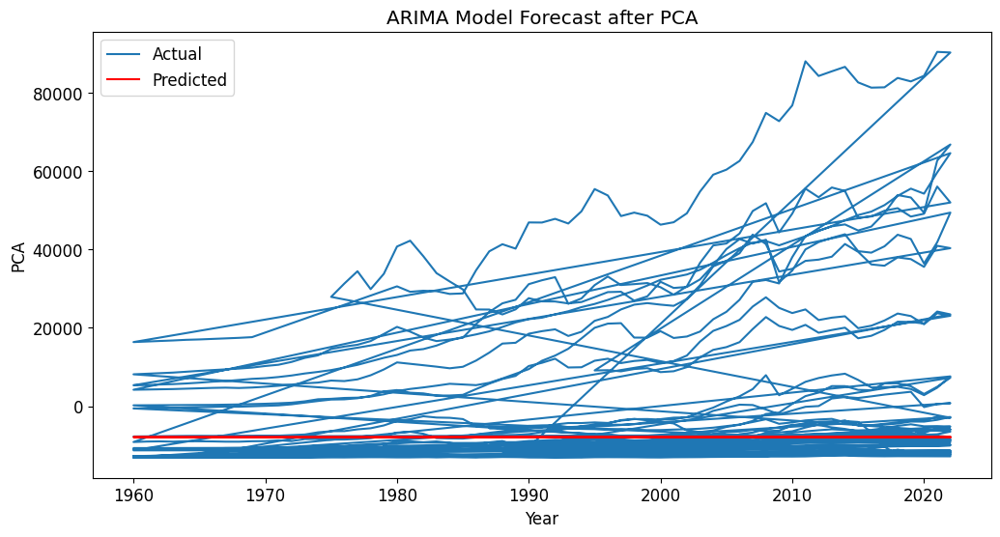

In [128]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Assuming 'gdp_df' is your DataFrame containing columns 'Year', 'Entity_encoded', 'Continent_encoded', and 'GDP_per_capita'
# Assuming 'gdp_df' is sorted by 'Year'

# Extract relevant features for PCA
X = gdp[['Entity_encoded', 'Continent_encoded', 'GDP_per_capita']]

# Perform PCA
pca = PCA(n_components=1)  # Choose the number of principal components
X_pca = pca.fit_transform(X)

# Concatenate with the 'Year' column
pca_df = pd.DataFrame(data=X_pca, columns=['PCA'])
pca_df['Year'] = gdp['Year'].values

# Split the data into train and test sets
train_size = int(len(pca_df) * 0.8)  # Use 80% of the data for training
train, test = pca_df[:train_size], pca_df[train_size:]

# Fit ARIMA model
model = ARIMA(train['PCA'], order=(5,1,0))  # Adjust the order as needed
model_fit = model.fit()

# Make predictions
predictions = model_fit.forecast(steps=len(test))

# Calculate MSE
mse = mean_squared_error(test['PCA'], predictions)
print('Mean Squared Error:', mse)

# Plot predictions
plt.figure(figsize=(12, 6))
plt.plot(test['Year'], test['PCA'], label='Actual')
plt.plot(test['Year'], predictions, color='red', label='Predicted')
plt.xlabel('Year')
plt.ylabel('PCA')
plt.title('ARIMA Model Forecast after PCA')
plt.legend()
plt.show()



# Apply LSTM Model for Forecasting GDP_per_capita

In [130]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Assuming 'gdp_df' is your DataFrame containing columns 'Year', 'Entity_encoded', 'Continent_encoded', and 'GDP_per_capita'
# Assuming 'gdp_df' is sorted by 'Year'

# Extract relevant features for PCA
X = gdp[['Entity_encoded', 'Continent_encoded', 'GDP_per_capita']]

# Perform PCA
pca = PCA(n_components=1)  # Choose the number of principal components
X_pca = pca.fit_transform(X)

# Concatenate with the 'Year' column
pca_df = pd.DataFrame(data=X_pca, columns=['PCA'])
pca_df['Year'] = gdp['Year'].values

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(pca_df[['PCA']])

# Concatenate with the 'Year' column
scaled_data_with_year = np.concatenate((scaled_data, pca_df[['Year']].values), axis=1)

# Split the data into train and test sets
train_size = int(len(scaled_data_with_year) * 0.8)  # Use 80% of the data for training
train, test = scaled_data_with_year[:train_size], scaled_data_with_year[train_size:]

# Function to create sequences for LSTM
def create_sequences(data, sequence_length):
    X, y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:(i + sequence_length), :-1])
        y.append(data[i + sequence_length, -1])
    return np.array(X), np.array(y)

# Define sequence length (number of time steps to look back)
sequence_length = 5  # You can adjust this value

# Create sequences for training and testing
X_train, y_train = create_sequences(train, sequence_length)
X_test, y_test = create_sequences(test, sequence_length)

# Define LSTM model architecture
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(LSTM(units=50))
model.add(Dense(units=1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1)

# Make predictions
predictions = model.predict(X_test)

# Inverse transform the predictions and actual values
predictions = scaler.inverse_transform(np.concatenate((X_test[:, -1, :-1], predictions), axis=1))[:, -1]
y_test = scaler.inverse_transform(np.concatenate((X_test[:, -1, :-1], y_test.reshape(-1, 1)), axis=1))[:, -1]

# Calculate MSE
mse = mean_squared_error(y_test, predictions)
print('Mean Squared Error:', mse)


Epoch 1/100
216/216 [==============================] - 4s 5ms/step - loss: 3929266.7500
Epoch 2/100
216/216 [==============================] - 1s 5ms/step - loss: 3872858.0000
Epoch 3/100
216/216 [==============================] - 1s 7ms/step - loss: 3827655.5000
Epoch 4/100
216/216 [==============================] - 2s 7ms/step - loss: 3783758.7500
Epoch 5/100
216/216 [==============================] - 1s 5ms/step - loss: 3740622.0000
Epoch 6/100
216/216 [==============================] - 1s 5ms/step - loss: 3698054.7500
Epoch 7/100
216/216 [==============================] - 1s 5ms/step - loss: 3655955.7500
Epoch 8/100
216/216 [==============================] - 1s 5ms/step - loss: 3614265.7500
Epoch 9/100
216/216 [==============================] - 1s 5ms/step - loss: 3572945.5000
Epoch 10/100
216/216 [==============================] - 1s 5ms/step - loss: 3531970.7500
Epoch 11/100
216/216 [==============================] - 1s 6ms/step - loss: 3491316.0000
Epoch 12/100
216/216 [========

#SARIMA model for Time forecasting GDP_per_capita

An unsupported index was provided and will be ignored when e.g. forecasting.
An unsupported index was provided and will be ignored when e.g. forecasting.
No supported index is available. Prediction results will be given with an integer index beginning at `start`.
No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.


Mean Squared Error: 270014476.33882874


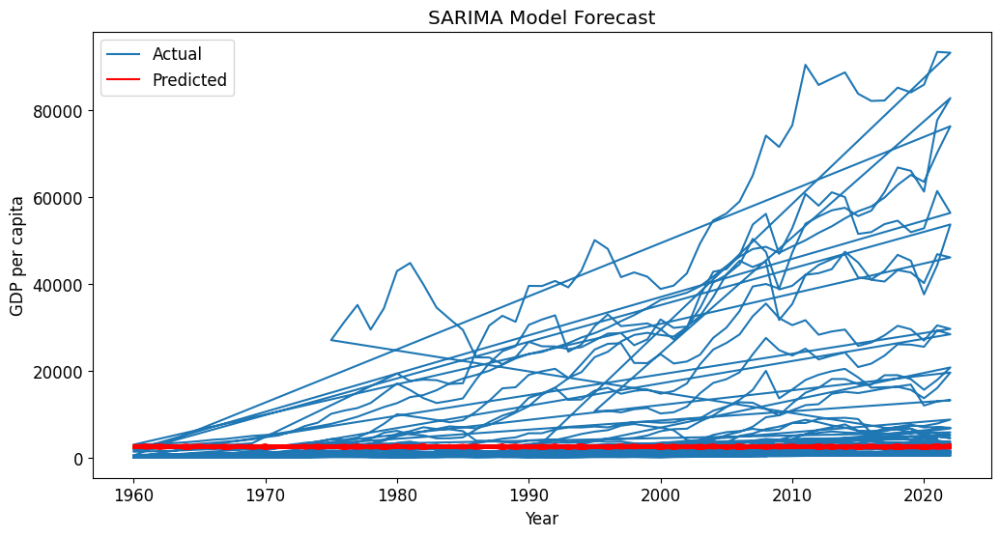

In [132]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Assuming 'gdp' is your DataFrame containing columns 'Year' and 'GDP_per_capita'
# Assuming 'gdp' is sorted by 'Year'

# Split the data into train and test sets
train_size = int(len(gdp) * 0.8)  # Use 80% of the data for training
train, test = gdp[:train_size], gdp[train_size:]

# Fit SARIMA model
model = SARIMAX(train['GDP_per_capita'], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
model_fit = model.fit()

# Make predictions
predictions = model_fit.predict(start=len(train), end=len(train) + len(test) - 1)

# Calculate MSE
mse = mean_squared_error(test['GDP_per_capita'], predictions)
print('Mean Squared Error:', mse)

# Plot predictions
plt.figure(figsize=(12, 6))
plt.plot(test['Year'], test['GDP_per_capita'], label='Actual')
plt.plot(test['Year'], predictions, color='red', label='Predicted')
plt.xlabel('Year')
plt.ylabel('GDP per capita')
plt.title('SARIMA Model Forecast')
plt.legend()
plt.show()


#Machine Learning algorithm for Predict GDP_per_capita

In [106]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error,r2_score
X=gdp[['Continent_encoded','Year','Entity_encoded']]
Y=gdp['GDP_per_capita']

# Assuming 'temp_df' contains your dataset with features and target variable


# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
X_test.head(5)

,Continent_encoded,Year,Entity_encoded
2323,1377,1979,959
9571,23588,1975,37314
8336,23588,1998,4213
5051,6569,1969,1799
6405,7145,1991,2238


In [ ]:
y_test.head(5)

2323     718
9497    8204
8262     578
5051     322
6331    1184
Name: GDP_per_capita, dtype: int64

#Apply machine learning algorithim

In [ ]:
# Initialize and train the Random Forest Regressor
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)
rf_regressor.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
# Prediction to input three Coninent_encoded,Year, and Entity_encoded
rf_regressor.predict([[1377,1979,959]])

X does not have valid feature names, but RandomForestRegressor was fitted with feature names


array([699.59])

#Predict Score of Algorithum

In [ ]:
# Predict on the test set
y_pred = rf_regressor.predict(X_test)
r2 = r2_score(y_test, y_pred)
print(r2)

0.9889010825289044


In [ ]:
merged_df = merged_df.dropna(subset=['Continent'])
numeric_columns = ['GDP per capita', 'health expenditure', 'Fertility rate','Employment in agriculture (% of total employment)','Employment in industry (% of total employment)','Employment in services (% of total employment)', 'Literacy rates','GDP per capita growth annual','Meat consumption', 'Cantril ladder score', 'Population density', 'Population', 'Median age',
    'Sex ratio', 'Urban population', 'suicide rate', 'Under five mortality rate',
    'Electoral democracy index', 'Unemployment', 'Share of population with no education','Share of population with at least some basic education']

numeric_columns

['GDP per capita',
 'health expenditure',
 'Fertility rate',
 'Employment in agriculture (% of total employment)',
 'Employment in industry (% of total employment)',
 'Employment in services (% of total employment)',
 'Literacy rates',
 'GDP per capita growth annual',
 'Meat consumption',
 'Cantril ladder score',
 'Population density',
 'Population',
 'Median age',
 'Sex ratio',
 'Urban population',
 'suicide rate',
 'Under five mortality rate',
 'Electoral democracy index',
 'Unemployment',
 'Share of population with no education',
 'Share of population with at least some basic education']

In [ ]:
# Convert 'Year' column to the same data type in both DataFrames
merged_df['Year'] = merged_df['Year'].astype(str)
world_data_gdp_melted['Year'] = world_data_gdp_melted['Year'].astype(str)

merged_df['Entity'] = merged_df['Entity'].str.lower()
world_data_gdp_melted['Entity'] = world_data_gdp_melted['Entity'].str.lower()


# # Perform a left merge to create a temporary DataFrame
temp_df = pd.merge(merged_df, world_data_gdp_melted[['Entity', 'Year', 'GDP_per_capita']], on=['Entity', 'Year'], how='left')
temp_df

,Entity,Year,Continent,GDP_per_capita
0,afghanistan,1950,Asia,NaN
1,afghanistan,1951,Asia,NaN
2,afghanistan,1952,Asia,NaN
3,afghanistan,1953,Asia,NaN
4,afghanistan,1954,Asia,NaN
...,...,...,...,...
14277,zimbabwe,2019,Africa,1421.868596
14278,zimbabwe,2020,Africa,1372.696674
14279,zimbabwe,2021,Africa,1773.920411
14280,zimbabwe,2022,Africa,1676.821489


In [ ]:
# Remove rows with NaN values only in the 'GDP per capita_y' column
temp_df.dropna(subset=['GDP_per_capita'], inplace=True)

#Visualization

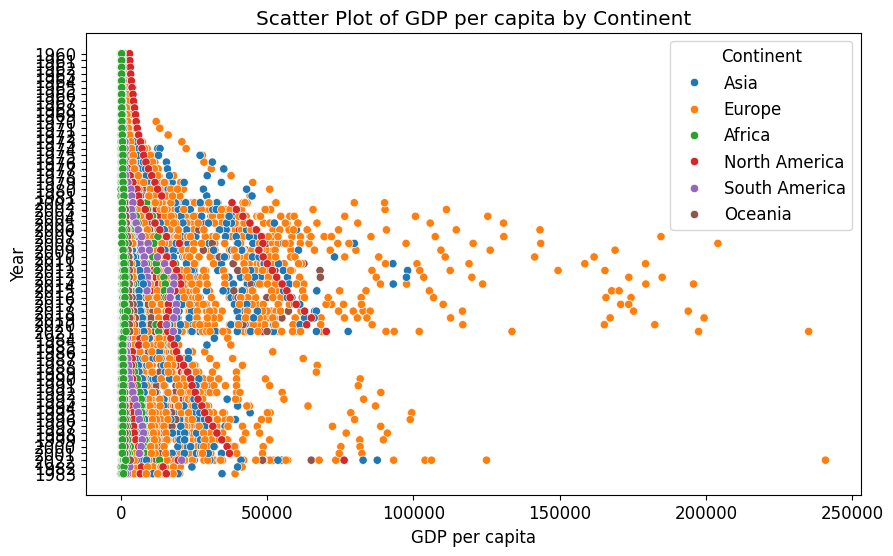

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=temp_df, x='GDP_per_capita', y='Year', hue='Continent')
plt.title('Scatter Plot of GDP per capita by Continent')
plt.xlabel('GDP per capita')
plt.ylabel('Year')
plt.legend(title='Continent')
plt.show()

# Time Series visualization

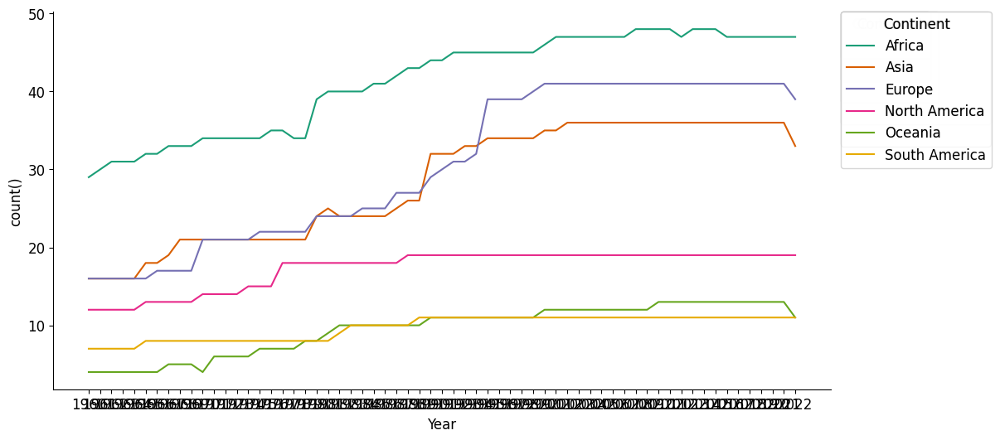

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['Year']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'Year'}, axis=1)
              .sort_values('Year', ascending=True))
  xs = counted['Year']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = temp_df.sort_values('Year', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Continent')):
  _plot_series(series, series_name, i)
  fig.legend(title='Continent', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('Year')
_ = plt.ylabel('count()')

#Categorical Distribution


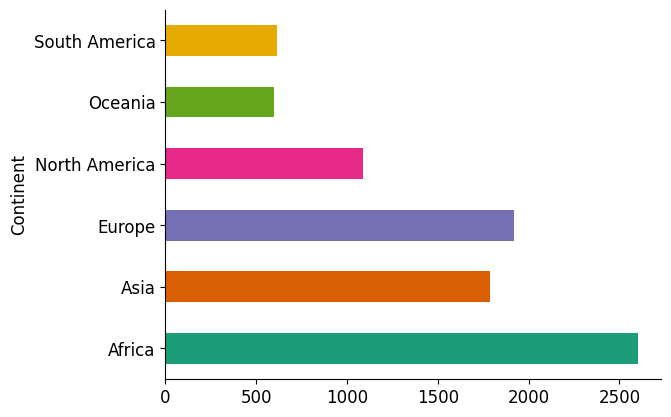

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
temp_df.groupby('Continent').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

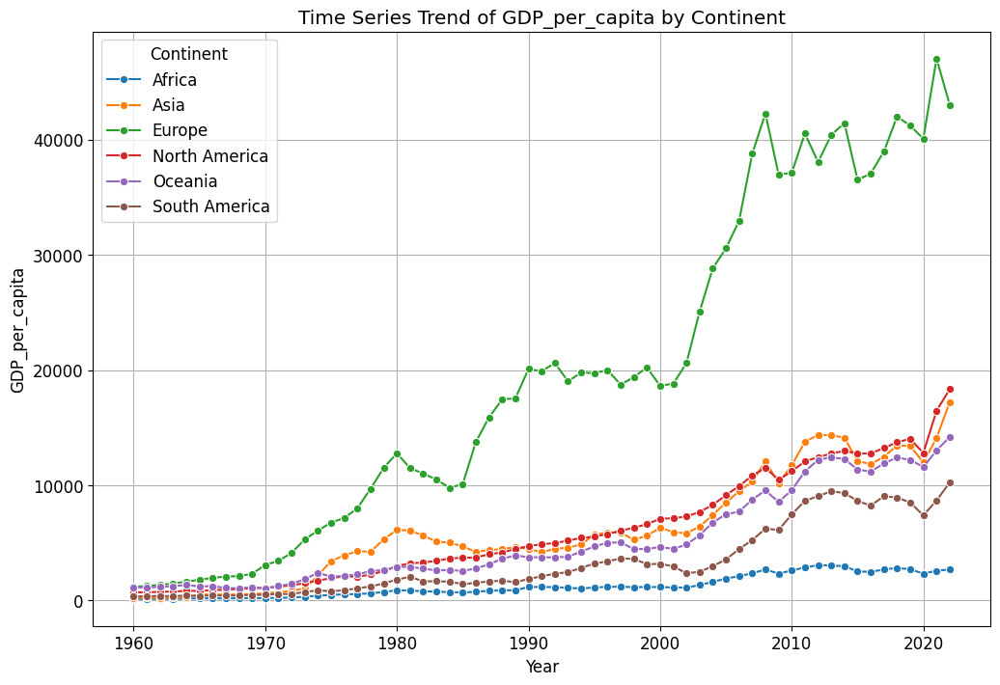

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert 'Year' column to datetime format if it's not already
temp_df['Year'] = pd.to_datetime(temp_df['Year'], format='%Y')

# Group data by 'Year' and 'Continent', and compute mean GDP_per_capita
grouped_df = temp_df.groupby(['Year', 'Continent'])['GDP_per_capita'].mean().reset_index()

# Plot the line plot
plt.figure(figsize=(12, 8))
sns.lineplot(data=grouped_df, x='Year', y='GDP_per_capita', hue='Continent', marker='o')
plt.title('Time Series Trend of GDP_per_capita by Continent')
plt.xlabel('Year')
plt.ylabel('GDP_per_capita')
plt.legend(title='Continent')
plt.grid(True)
plt.show()


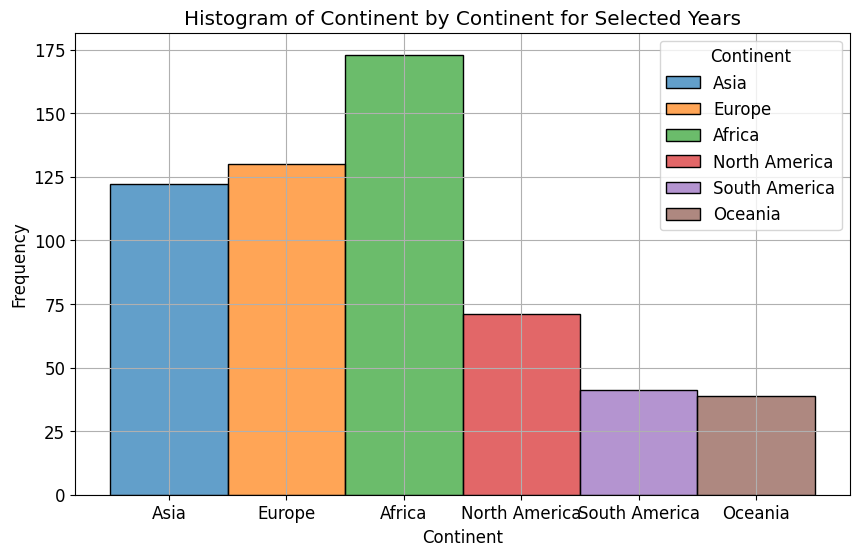

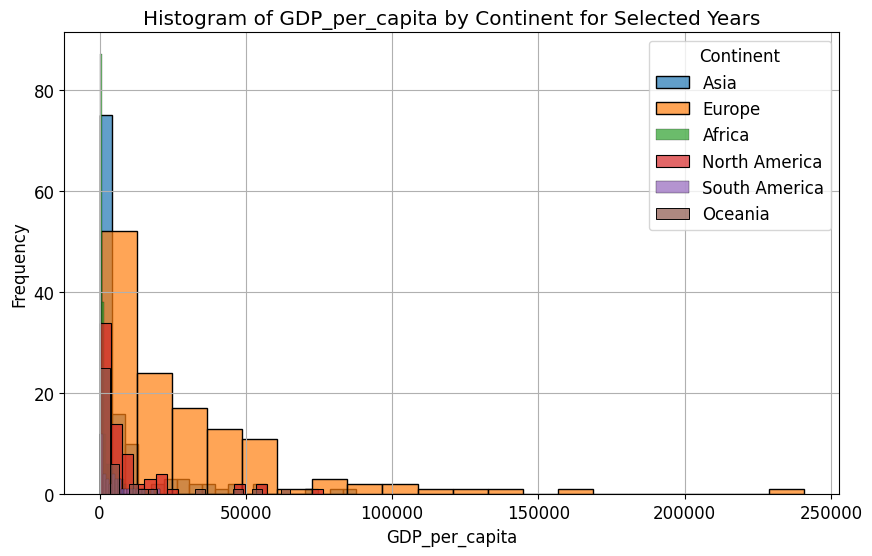

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the DataFrame for selected years
selected_years = ['1970', '1990', '2010', '2022']
filtered_df = temp_df[temp_df['Year'].isin(selected_years)]

# Loop through each feature and create histograms
features = filtered_df.columns[2:]  # Exclude 'Year' and 'Continent' columns
for feature in features:
    plt.figure(figsize=(10, 6))
    for continent in filtered_df['Continent'].unique():
        sns.histplot(data=filtered_df[filtered_df['Continent'] == continent], x=feature, bins=20, label=continent, alpha=0.7)
    plt.title(f'Histogram of {feature} by Continent for Selected Years')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend(title='Continent')
    plt.grid(True)
    plt.show()


In [ ]:
selected_years = ['1970', '1990', '2010', '2022']  # Adjust the years as per your data
continents = temp_df['Continent'].unique()

Year
1960-01-01     62.369375
1961-01-01     62.443703
1962-01-01     60.950364
1963-01-01     82.021738
1964-01-01     85.511073
1965-01-01    105.243196
1966-01-01    143.103233
1967-01-01    167.165675
1968-01-01    134.012768
1969-01-01    134.250360
1970-01-01    162.642175
1971-01-01    166.224831
1972-01-01    141.365322
1973-01-01    149.744068
1974-01-01    181.598776
1975-01-01    194.669036
1976-01-01    205.674097
1977-01-01    232.778699
1978-01-01    255.045622
1979-01-01    284.755532
1980-01-01    291.649791
1981-01-01    311.853617
2002-01-01    182.174037
2003-01-01    199.643228
2004-01-01    221.830531
2005-01-01    254.115274
2006-01-01    274.015394
2007-01-01    376.318296
2008-01-01    382.533804
2009-01-01    453.387382
2010-01-01    562.499219
2011-01-01    608.738856
2012-01-01    653.417479
2013-01-01    638.733185
2014-01-01    626.512930
2015-01-01    566.881133
2016-01-01    523.053012
2017-01-01    526.140801
2018-01-01    492.090632
2019-01-01    497.74

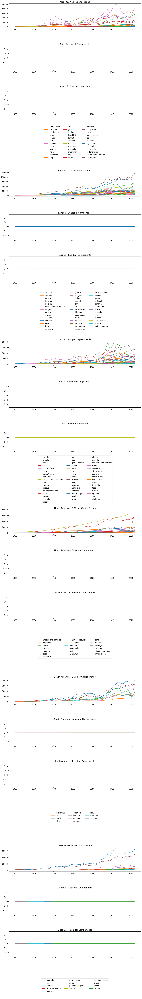

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
import seaborn as sns  # For more color options

# Assuming merged_df has columns 'Continent' and 'Entity'
continents = temp_df['Continent'].unique()

# Set up the figure for plotting
# Allocating an extra row per continent for the legend
nrows = len(continents) * 4
ncols = 1
fig_height = nrows * 4  # Significantly increased figure height for more space
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, fig_height))
fig.tight_layout(pad=6.0, h_pad=8.0)  # Further increased padding for extra space

# Dictionary to store lines for legends
lines_for_legend = {}

# Iterate through each continent
for i, continent in enumerate(continents):
    # Get all entities (countries) in the continent
    entities = temp_df[temp_df['Continent'] == continent]['Entity'].unique()

    # Create an index offset to accommodate the extra row for the legend
    offset = i * 4

    # Iterate through each entity and plot its GDP per capita components
    for entity in entities:
        # Filter data for each entity and fill missing values
        gdp_series = temp_df[(temp_df['Continent'] == continent) & (temp_df['Entity'] == entity)].set_index('Year')['GDP_per_capita'].fillna(method='ffill')
        print(gdp_series)
        # Decompose (if there are enough data points)
        if len(gdp_series) > 2:
            decomposition = seasonal_decompose(gdp_series, model='additive', period=1)

            # Plotting each entity's components in different colors
            trend_line, = axes[offset].plot(decomposition.trend.dropna(), label=entity)
            seasonal_line, = axes[offset + 1].plot(decomposition.seasonal.dropna(), label=entity)
            resid_line, = axes[offset + 2].plot(decomposition.resid.dropna(), label=entity)

            # Store one line per entity for the legend
            lines_for_legend[entity] = trend_line

    # Set titles for the plots
    axes[offset].set_title(f'{continent} - GDP per Capita Trends')
    axes[offset + 1].set_title(f'{continent} - Seasonal Components')
    axes[offset + 2].set_title(f'{continent} - Residual Components')

    # Place the legend in the extra row allocated for each continent
    axes[offset + 3].axis('off')  # Turn off the axis for the legend row
    axes[offset + 3].legend(lines_for_legend.values(), lines_for_legend.keys(), loc='center', ncol=3)

    # Clear the dictionary for the next continent
    lines_for_legend.clear()

plt.show()


In [ ]:
temp_df.head(5)

,Entity,Year,Continent,GDP_per_capita
10,afghanistan,1960-01-01,Asia,62.369375
11,afghanistan,1961-01-01,Asia,62.443703
12,afghanistan,1962-01-01,Asia,60.950364
13,afghanistan,1963-01-01,Asia,82.021738
14,afghanistan,1964-01-01,Asia,85.511073


In [ ]:
import colorsys

In [ ]:
# Check the data type of the 'Entity' column
print(temp_df['Entity'].dtype)

# Check the unique values in the 'Entity' column
print(temp_df['Entity'].unique())

# Count the number of non-numeric values in the 'Entity' column
print(temp_df['Entity'].str.isnumeric().sum())

object
['afghanistan' 'albania' 'algeria' 'andorra' 'angola' 'antigua and barbuda' 'argentina' 'armenia' 'australia' 'austria' 'azerbaijan' 'bahrain' 'bangladesh' 'barbados' 'belarus' 'belgium' 'belize'
 'benin' 'bhutan' 'bolivia' 'bosnia and herzegovina' 'botswana' 'brazil' 'bulgaria' 'burkina faso' 'burundi' "cote d'ivoire" 'cambodia' 'cameroon' 'canada' 'central african republic' 'chad' 'chile'
 'china' 'colombia' 'comoros' 'costa rica' 'croatia' 'cuba' 'cyprus' 'denmark' 'djibouti' 'dominica' 'dominican republic' 'ecuador' 'el salvador' 'equatorial guinea' 'eritrea' 'estonia' 'eswatini'
 'ethiopia' 'fiji' 'finland' 'france' 'gabon' 'georgia' 'germany' 'ghana' 'greece' 'grenada' 'guatemala' 'guinea' 'guinea-bissau' 'guyana' 'haiti' 'honduras' 'hungary' 'iceland' 'india' 'indonesia'
 'iraq' 'ireland' 'israel' 'italy' 'jamaica' 'japan' 'jordan' 'kazakhstan' 'kenya' 'kiribati' 'kuwait' 'latvia' 'lebanon' 'lesotho' 'liberia' 'libya' 'liechtenstein' 'lithuania' 'luxembourg'
 'madagascar'

#Grouped Bar Plot:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.


<Figure size 1000x600 with 0 Axes>

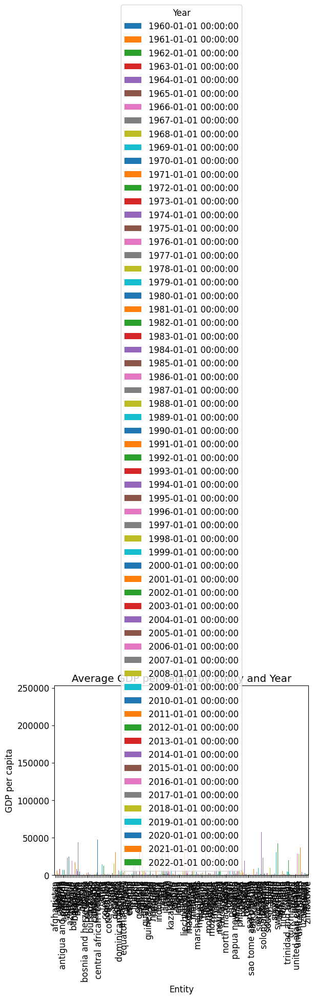

In [ ]:
import matplotlib.pyplot as plt

# Grouped bar plot
plt.figure(figsize=(10, 6))
temp_df.groupby(['Entity', 'Year'])['GDP_per_capita'].mean().unstack().plot(kind='bar')
plt.xlabel('Entity')
plt.ylabel('GDP per capita')
plt.title('Average GDP per capita by Entity and Year')
plt.legend(title='Year')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


#Line Plot:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.


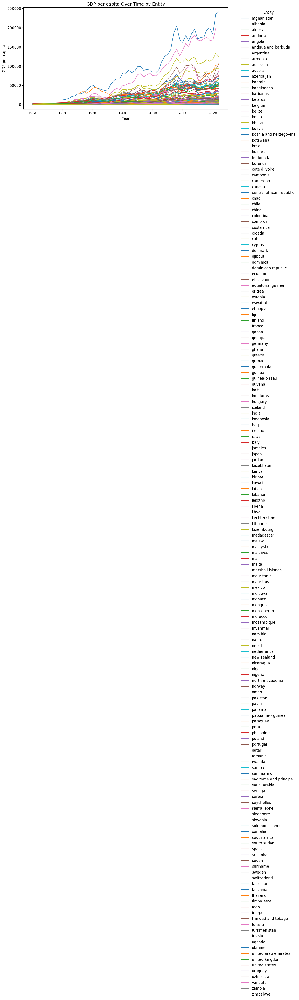

In [ ]:
import seaborn as sns

# Line plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=temp_df, x='Year', y='GDP_per_capita', hue='Entity', palette='tab10')
plt.xlabel('Year')
plt.ylabel('GDP per capita')
plt.title('GDP per capita Over Time by Entity')
plt.legend(title='Entity', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


#Faceted Plot

<Figure size 1200x800 with 0 Axes>

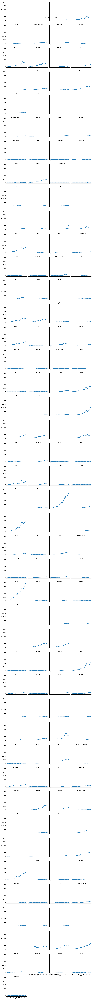

In [ ]:
import seaborn as sns

# Faceted scatter plot
plt.figure(figsize=(12, 8))
g = sns.FacetGrid(temp_df, col='Entity', col_wrap=4, height=4)
g.map(sns.scatterplot, 'Year', 'GDP_per_capita')
g.set_titles('{col_name}')
plt.subplots_adjust(top=0.9)
plt.suptitle('GDP per capita Over Time by Entity', fontsize=16)
plt.tight_layout()
plt.show()


In [ ]:
numeric_columns = ['GDP_per_capita', 'health_expenditure', 'Fertility_rate','Employment in agriculture (% of total employment)','Employment in industry (% of total employment)','Employment in services (% of total employment)', 'Literacy rates','GDP per capita growth annual','Meat consumption', 'Cantril ladder score', 'Population density', 'Population', 'Median age',
    'Sex ratio', 'Urban population', 'suicide rate', 'Under five mortality rate',
    'Electoral democracy index', 'Unemployment', 'Share of population with no education','Share of population with at least some basic education']


GDP per capita


Index(['Entity', 'Year', 'Continent', 'GDP_per_capita', 'Income Level',
       'Rolling Growth Rate', 'Correlation with Ideal', 'Peak GDP',
       'Trough GDP', 'GDP Growth Volatility'],
      dtype='object')


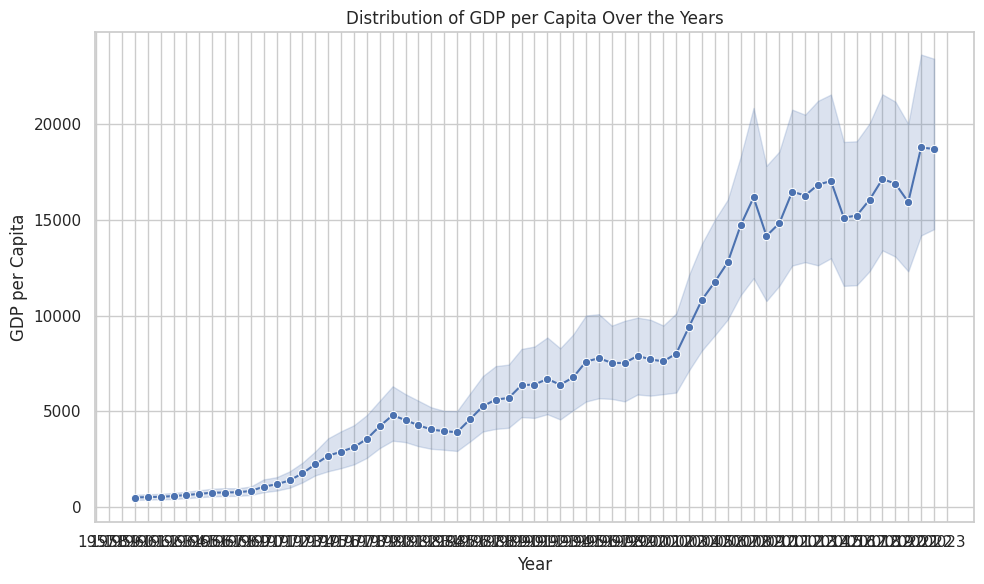

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'temp_df' is your DataFrame with columns 'Entity', 'Year', and 'GDP_per_capita'

# Set the style of seaborn
sns.set(style="whitegrid")

# Create a seaborn lineplot to visualize the distribution of GDP_per_capita over the years
plt.figure(figsize=(10, 6))
sns.lineplot(data=temp_df, x='Year', y='GDP_per_capita', marker='o', color='b')

# Set plot title and labels
plt.title('Distribution of GDP per Capita Over the Years')
plt.xlabel('Year')
plt.ylabel('GDP per Capita')

# Show the plot
plt.tight_layout()
plt.show()


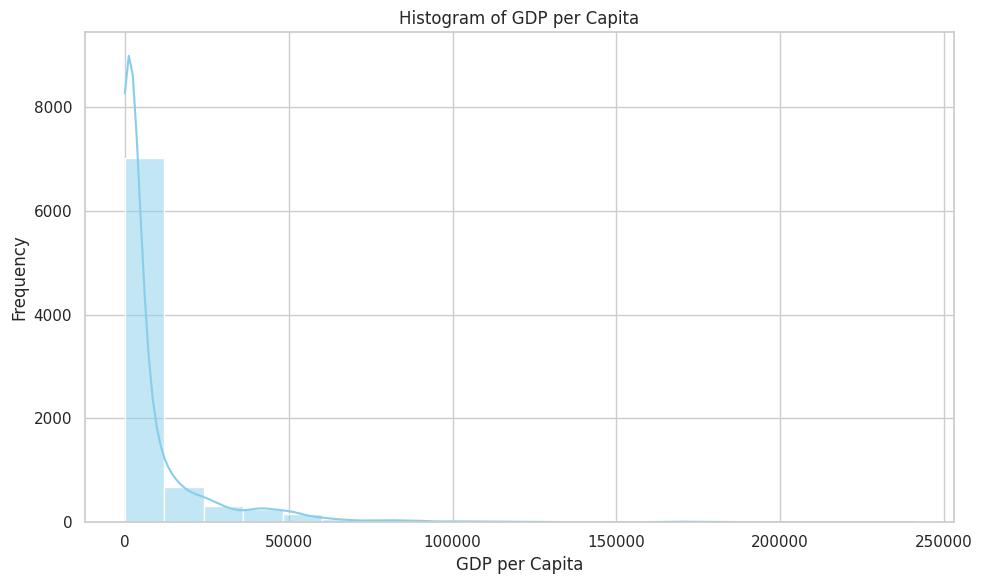

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'temp_df' is your DataFrame with columns 'Entity', 'Year', and 'GDP_per_capita'

# Set the style of seaborn
sns.set(style="whitegrid")

# Create a histogram using histplot
plt.figure(figsize=(10, 6))
sns.histplot(data=temp_df, x='GDP_per_capita', bins=20, kde=True, color='skyblue')

# Set plot title and labels
plt.title('Histogram of GDP per Capita')
plt.xlabel('GDP per Capita')
plt.ylabel('Frequency')

# Show the plot
plt.tight_layout()
plt.show()



In [ ]:
summary_stats_per_continent = temp_df.groupby('Continent').describe()
print(summary_stats_per_continent)

              Entity                                   Year                    \
               count unique                  top freq count unique   top freq   
Continent                                                                       
Africa          3996     54              algeria   74  3996     74  1950   54   
Asia            3404     46          afghanistan   74  3404     74  1950   46   
Europe          3256     44              albania   74  3256     74  1950   44   
North America   1702     23  antigua and barbuda   74  1702     74  1950   23   
Oceania         1036     14            australia   74  1036     74  1950   14   
South America    888     12            argentina   74   888     74  1950   12   

              GDP_per_capita                            
                       count  unique          top freq  
Continent                                               
Africa                2601.0  2601.0   239.033006  1.0  
Asia                  1788.0  1788.0    62

In [ ]:
# Convert 'GDP_per_capita' column to numeric
temp_df['GDP_per_capita'] = pd.to_numeric(temp_df['GDP_per_capita'], errors='coerce')
# temp_df['Year'] = temp_df['Year'].astype('category')
temp_df['Year'] = temp_df['Year'].astype('int64')


In [ ]:
temp_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14282 entries, 0 to 14281
Data columns (total 4 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Entity          14282 non-null  object 
 1   Year            14282 non-null  int64  
 2   Continent       14282 non-null  object 
 3   GDP_per_capita  8614 non-null   float64
dtypes: float64(1), int64(1), object(2)
memory usage: 557.9+ KB


#KDE Plot of GDP per capita by Continent

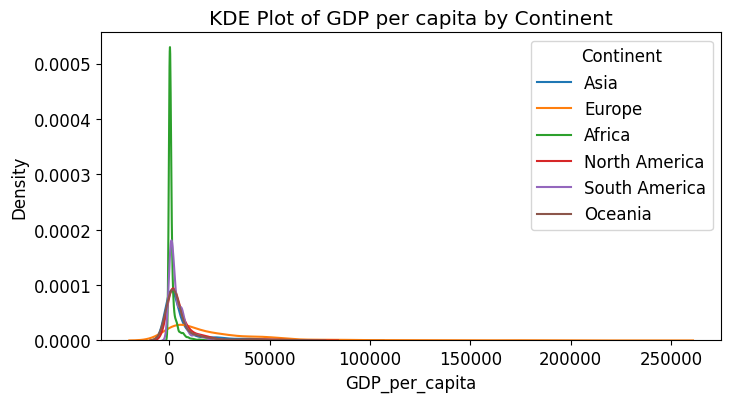

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert 'GDP_per_capita' column to numeric
temp_df['GDP_per_capita'] = pd.to_numeric(temp_df['GDP_per_capita'], errors='coerce')

# Create KDE plot
plt.figure(figsize=(8, 4))
for continent in temp_df['Continent'].unique():
    sns.kdeplot(data=temp_df[temp_df['Continent'] == continent], x='GDP_per_capita', label=continent)
plt.title('KDE Plot of GDP per capita by Continent')
plt.legend(title='Continent', loc='upper right')
plt.show()


In [ ]:
#handle these missing values. before we pivote apply
temp_df['GDP_per_capita'] = temp_df['GDP_per_capita'].fillna(temp_df['GDP_per_capita'].mean())
temp_df.dropna(subset=['GDP_per_capita'], inplace=True)


In [ ]:
print(temp_df.isnull().sum())


Entity            0
Year              0
Continent         0
GDP_per_capita    0
dtype: int64


# Elbow plot and Income level of different country

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
# Check for missing values in the income column
missing_values = temp_df['GDP_per_capita'].isnull().sum()
print("Number of missing values in GDP_per_capita column:", missing_values)
# Fill missing values with the mean of the column
temp_df['GDP_per_capita'].fillna(temp_df['GDP_per_capita'].mean(), inplace=True)
pivoted_df = temp_df.pivot(index='Entity', columns='Year', values='GDP_per_capita')
# Fill NaN values with the mean of each column
pivoted_df.fillna(pivoted_df.mean(), inplace=True)
# Check the first few rows of the pivoted DataFrame
print(pivoted_df.head())


Number of missing values in GDP_per_capita column: 0
Year         -315619200000000000   -283996800000000000   -252460800000000000   \
Entity                                                                          
afghanistan             62.369375             62.443703             60.950364   
albania                505.736868            528.198380            543.473106   
algeria                239.033006            209.917178            169.927013   
andorra                505.736868            528.198380            543.473106   
angola                 505.736868            528.198380            543.473106   

Year         -220924800000000000   -189388800000000000   -157766400000000000   \
Entity                                                                          
afghanistan             82.021738             85.511073            105.243196   
albania                579.639098            636.422939            693.393177   
algeria                225.823391            238.877805

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` exp

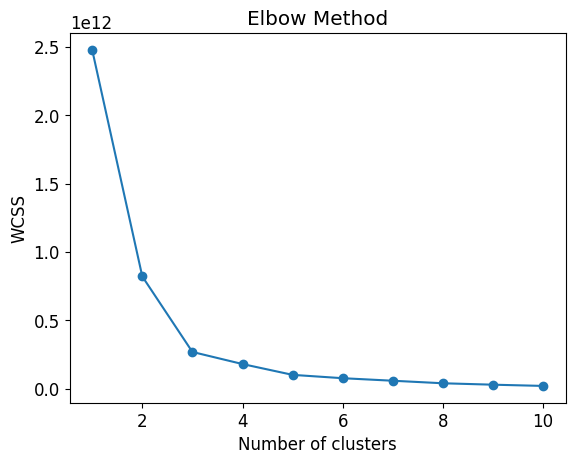

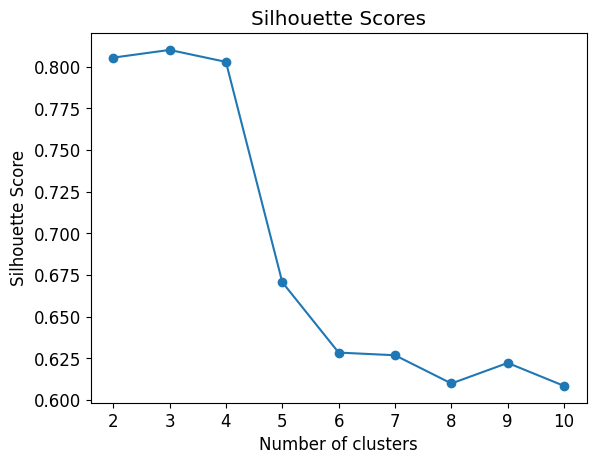

In [ ]:
# Assuming merged_df is your DataFrame and contains 'Country', 'Year', and 'GDP per capita'

# Step 1: Data Transformation
# Pivot the DataFrame to get countries as rows and years as columns
# pivoted_df = temp_df.pivot_table(index='Entity', columns='Year', values='GDP_per_capita', aggfunc=np.mean)
# # Assuming you want to fill NaN values with the mean of each column
# pivoted_df.fillna(pivoted_df.mean(), inplace=True)

# Optional Step 2: Dimensionality Reduction
pca = PCA(n_components=0.95)  # Retain 95% of the variance
X_pca = pca.fit_transform(pivoted_df)

# Step 3: Clustering
wcss = []
silhouette_scores = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_pca)
    wcss.append(kmeans.inertia_)
    if i > 1:
        silhouette_scores.append(silhouette_score(X_pca, kmeans.labels_))

# Step 4: Evaluation
# Elbow Method
plt.figure()
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

# Silhouette Scores
plt.figure()
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Scores')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [ ]:
from sklearn.cluster import KMeans
import pandas as pd

# Check Data Integrity
print(temp_df.describe())

# Verify Clustering Algorithm Parameters
optimal_clusters = 3
final_kmeans = KMeans(n_clusters=optimal_clusters, init='k-means++', random_state=42)

# Data Preprocessing
# Fill missing values in 'GDP_per_capita' column
temp_df['GDP_per_capita'].fillna(temp_df['GDP_per_capita'].mean(), inplace=True)

# Pivot the DataFrame
pivoted_df = temp_df.pivot(index='Entity', columns='Year', values='GDP_per_capita')

# Fill NaN Values in the Pivot Table
pivoted_df.fillna(pivoted_df.mean(), inplace=True)

# Apply Clustering
X_pca = pivoted_df.values
final_clusters = final_kmeans.fit_predict(X_pca)

# Add the cluster label to your DataFrame
cluster_labels = dict(zip(pivoted_df.index, final_clusters))
temp_df['Income Level'] = temp_df['Entity'].map(cluster_labels)

# Display the DataFrame
temp_df


               Year  GDP_per_capita
count  8.614000e+03     8614.000000
mean   7.825659e+17     8690.231571
std    5.481583e+17    18284.925447
min   -3.156192e+17       11.792676
25%    3.471552e+17      543.920082
50%    8.204544e+17     1871.574083
75%    1.262304e+18     7588.384528
max    1.640995e+18   240862.182448


The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


,Entity,Year,Continent,GDP_per_capita,Income Level
10,afghanistan,-315619200000000000,Asia,62.369375,2
11,afghanistan,-283996800000000000,Asia,62.443703,2
12,afghanistan,-252460800000000000,Asia,60.950364,2
13,afghanistan,-220924800000000000,Asia,82.021738,2
14,afghanistan,-189388800000000000,Asia,85.511073,2
...,...,...,...,...,...
14276,zimbabwe,1514764800000000000,Africa,2269.177012,2
14277,zimbabwe,1546300800000000000,Africa,1421.868596,2
14278,zimbabwe,1577836800000000000,Africa,1372.696674,2
14279,zimbabwe,1609459200000000000,Africa,1773.920411,2


#GDP Analysis for Continent

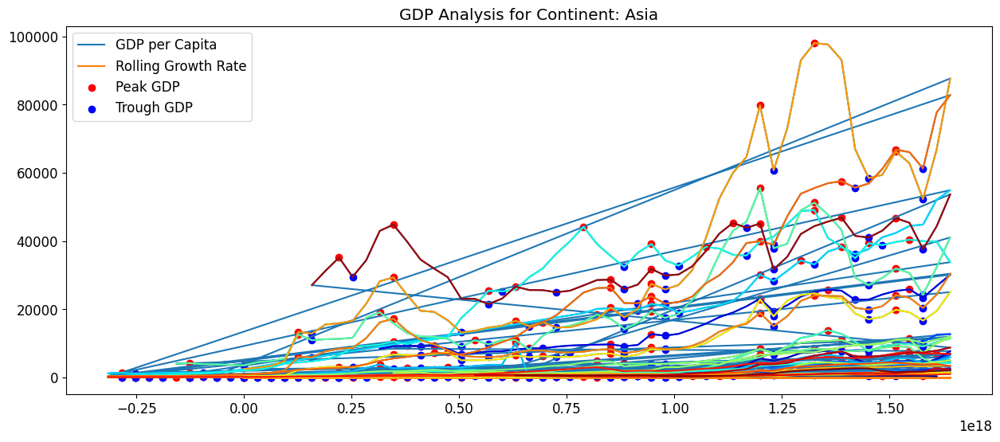

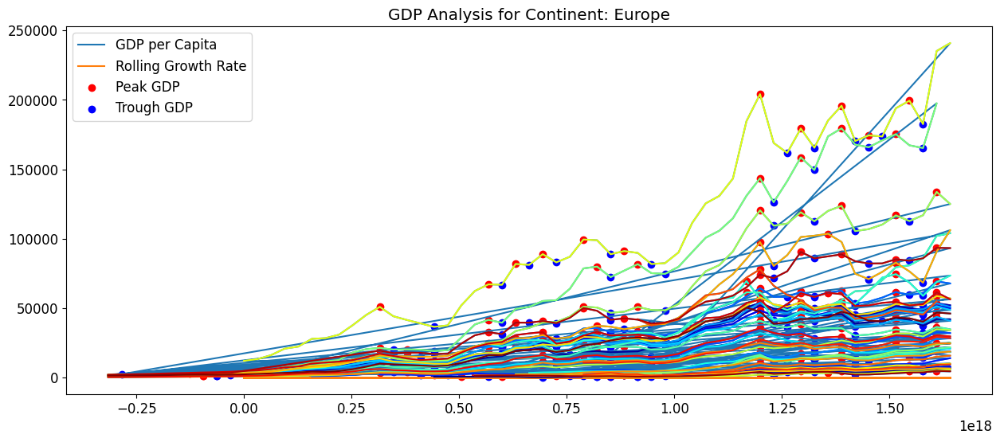

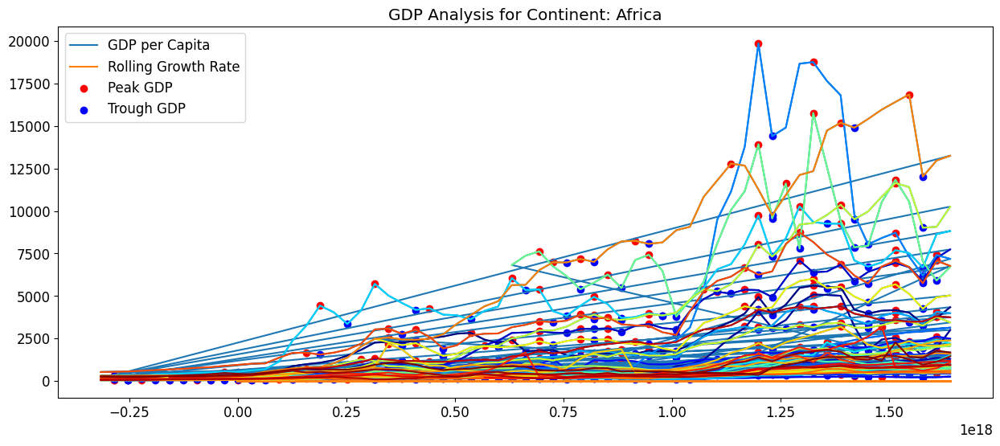

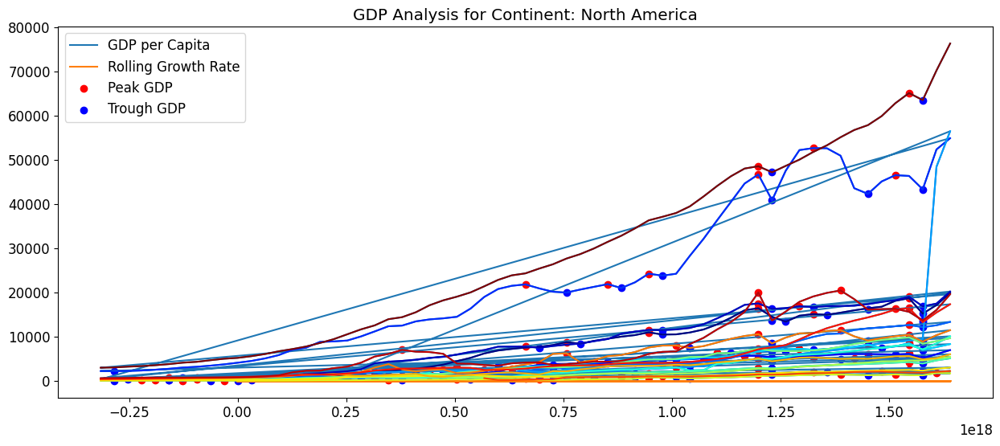

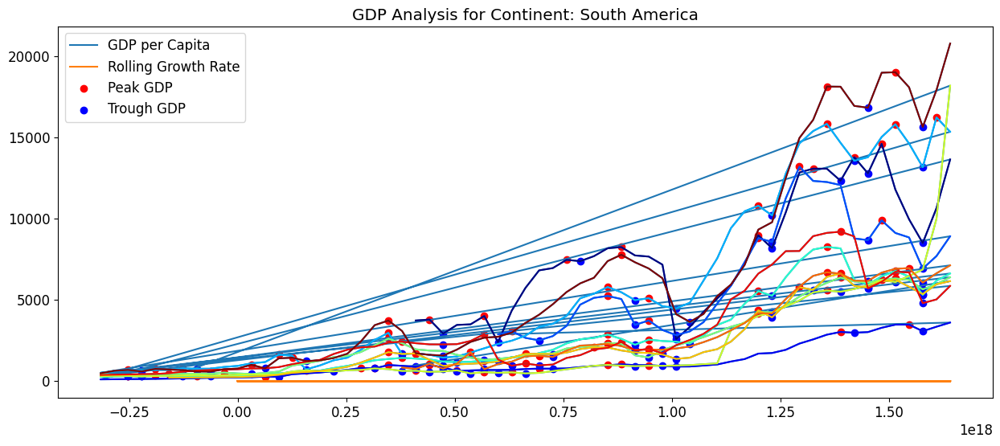

...

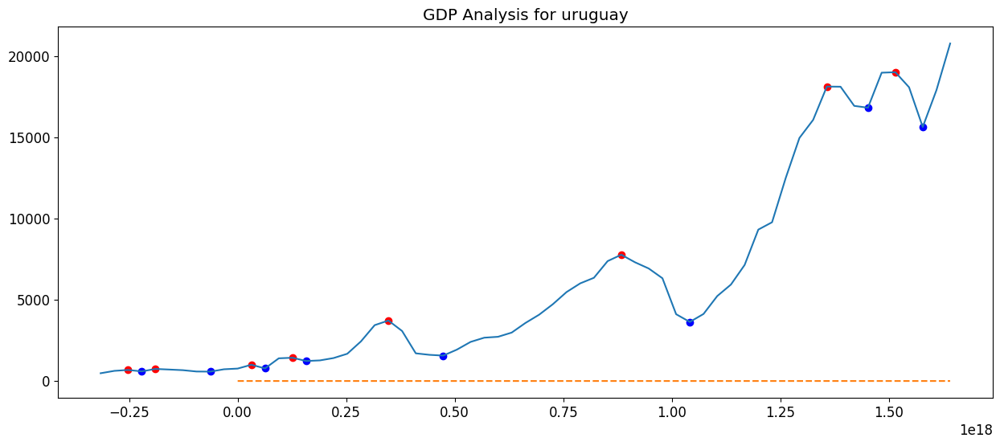

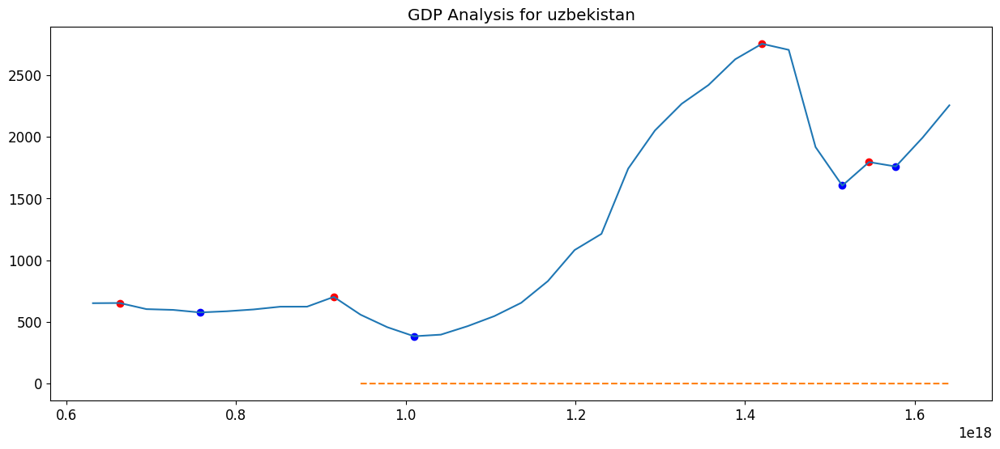

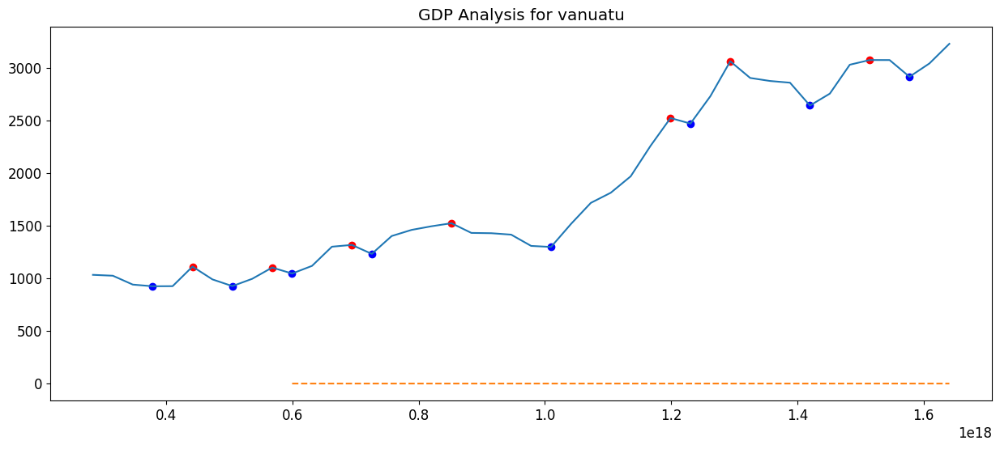

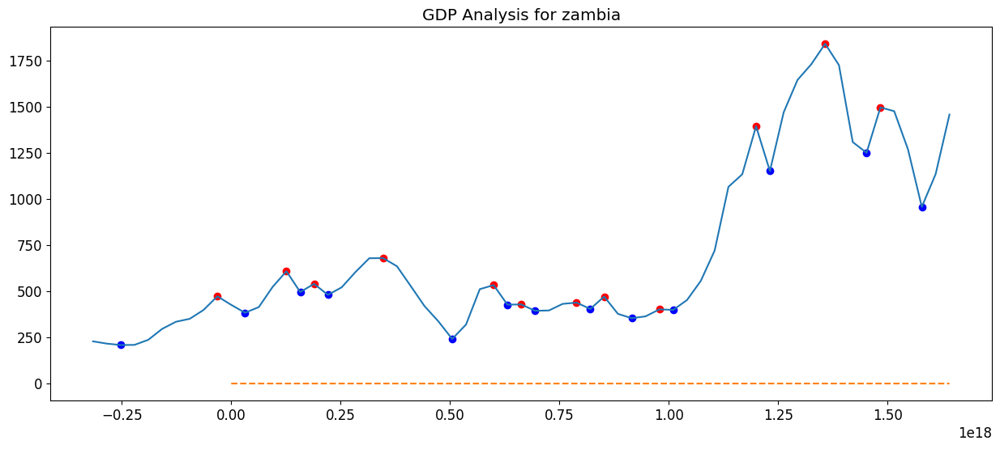

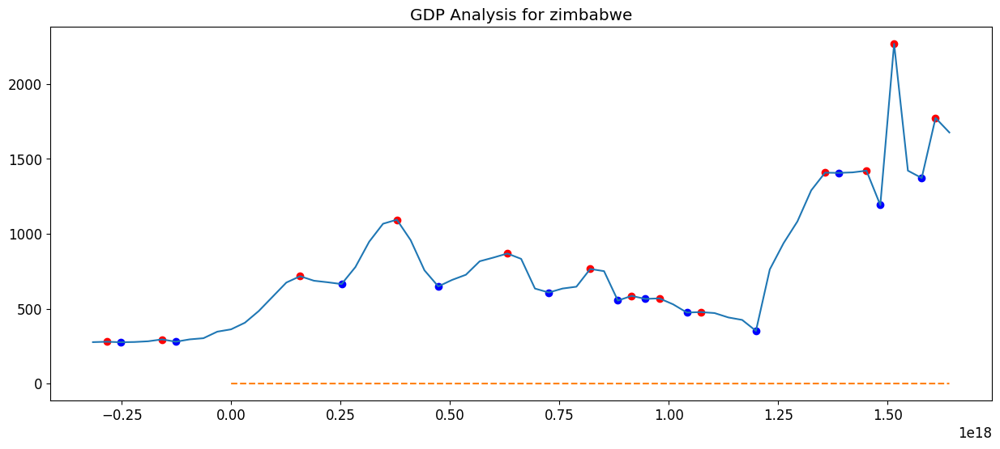

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from scipy.signal import find_peaks

# Assuming temp_df contains 'Entity', 'Year', 'Continent', and 'GDP per capita'

# Function for Rolling Window Analysis
def rolling_growth_rate(series, window_size):
    return series.pct_change().rolling(window=window_size).mean()

# Function to calculate GDP growth volatility
def gdp_growth_volatility(series, window_size):
    return series.pct_change().rolling(window=window_size).std()

# Function for Correlation with Ideal Pattern
def correlation_with_ideal(series, ideal_pattern):
    min_length = min(len(series), len(ideal_pattern))
    return pearsonr(series[:min_length], ideal_pattern[:min_length])[0]

# Define an ideal growth pattern
ideal_growth = np.linspace(0, 1, 50)  # Adjust as per your data

# Initialize new columns in temp_df
temp_df['Rolling Growth Rate'] = np.nan
temp_df['Correlation with Ideal'] = np.nan
temp_df['Peak GDP'] = np.nan
temp_df['Trough GDP'] = np.nan
temp_df['GDP Growth Volatility'] = np.nan

# Analyze for each Entity and Continent
for (entity, continent), group in temp_df.groupby(['Entity', 'Continent']):
    sorted_group = group.sort_values(by='Year')
    gdp_series = sorted_group['GDP_per_capita']

    # Rolling Window Analysis
    rolling_growth = rolling_growth_rate(gdp_series, window_size=10)

    # Correlation with Ideal Pattern
    correlation = correlation_with_ideal(gdp_series, ideal_growth)

    # Peak and Trough Detection
    peaks, _ = find_peaks(gdp_series)
    troughs, _ = find_peaks(-gdp_series)  # Inverting the series to find troughs

    # GDP Growth Volatility
    volatility = gdp_growth_volatility(gdp_series, window_size=5)

    # Assign calculations back to merged_df
    temp_df.loc[sorted_group.index, 'Rolling Growth Rate'] = rolling_growth
    temp_df.loc[sorted_group.index, 'Correlation with Ideal'] = correlation
    temp_df.loc[sorted_group.index[peaks], 'Peak GDP'] = gdp_series.iloc[peaks]
    temp_df.loc[sorted_group.index[troughs], 'Trough GDP'] = gdp_series.iloc[troughs]
    temp_df.loc[sorted_group.index, 'GDP Growth Volatility'] = volatility

# Generate plots for all Entities and Continents
for continent in temp_df['Continent'].unique():
    continent_data = temp_df[temp_df['Continent'] == continent]
    plt.figure(figsize=(15, 6))

    entities = continent_data['Entity'].unique()
    colors = plt.cm.jet(np.linspace(0, 1, len(entities)))



    plt.plot(continent_data['Year'], continent_data['GDP_per_capita'], label='GDP per Capita')
    plt.plot(continent_data['Year'], continent_data['Rolling Growth Rate'], label='Rolling Growth Rate')
    plt.scatter(continent_data['Year'], continent_data['Peak GDP'], color='red', label='Peak GDP')
    plt.scatter(continent_data['Year'], continent_data['Trough GDP'], color='blue', label='Trough GDP')
    for color, entity in zip(colors, entities):
        entity_data = continent_data[continent_data['Entity'] == entity]
        plt.plot(entity_data['Year'], entity_data['GDP_per_capita'], color=color)

    plt.title(f"GDP Analysis for Continent: {continent}")
    plt.legend()
    plt.show()


for entity in temp_df['Entity'].unique():
    entity_data = temp_df[temp_df['Entity'] == entity]

    plt.figure(figsize=(15, 6))
    plt.plot(entity_data['Year'], entity_data['GDP_per_capita'], label='GDP per Capita')
    plt.plot(entity_data['Year'], entity_data['Rolling Growth Rate'], label='Rolling Growth Rate', linestyle='--')
    plt.scatter(entity_data['Year'][entity_data['Peak GDP'].notna()], entity_data['Peak GDP'].dropna(), color='red', label='Peak GDP')
    plt.scatter(entity_data['Year'][entity_data['Trough GDP'].notna()], entity_data['Trough GDP'].dropna(), color='blue', label='Trough GDP')

    plt.title(f"GDP Analysis for {entity}")
    plt.show()

#NLP Project

In [ ]:
import pandas as pd

In [ ]:
headlines_df = pd.read_csv('/content/drive/MyDrive/python project/labeled_headlines_labeled_untilandinclude_703_record.csv')
headlines_df.head(5)

,Headline,Date,Source,Country Pairs,Labels
0,US drone strike kills seven militants in Pakistan: officials,2010,Agence France Presse,"[('united states', 'pakistan')]",[conflict]
1,An-24 plane crew with 3 Russians released in Somalia.,2010,ITAR-TASS World Service,"[('russia', 'somalia')]",[ally]
2,Second US drone strike kills four militants in Pakistan,2011,Agence France Presse,"[('united states', 'pakistan')]",[conflict]
3,US drone strikes kill 11 militants in Pakistan: officials,2011,Agence France Presse,"[('united states', 'pakistan')]",[conflict]
4,Third US drone strike kills four militants in Pakistan,2011,Agence France Presse,"[('united states', 'pakistan')]",[conflict]


In [ ]:
headlines_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8078 entries, 0 to 8077
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Headline       8078 non-null   object
 1   Date           8078 non-null   int64 
 2   Source         7076 non-null   object
 3   Country Pairs  8078 non-null   object
 4   Labels         699 non-null    object
dtypes: int64(1), object(4)
memory usage: 315.7+ KB


# Taking Only input and output columns

In [ ]:
# Taking Headlines and labels columns
headlines_df=headlines_df[['Headline','Labels']]

In [ ]:
headlines_df['Labels'].isna().sum()

7379

In [ ]:
#Remove it nan values from Labels
# Assuming headlines_df is your DataFrame
headlines_df.dropna(subset=['Labels'], inplace=True)

In [ ]:
headlines_df.isna().sum()

Headline    0
Labels      0
dtype: int64

#Text Preprocessing

In [ ]:
headlines_df['Headline']

0                                 US drone strike  kills  seven  militants  in Pakistan: officials 
1                                            An-24 plane crew with 3 Russians released in Somalia. 
2                                      Second US drone strike  kills  four  militants  in Pakistan 
3                                    US drone strikes  kill  11  militants  in Pakistan: officials 
4                                       Third US drone strike  kills  four  militants  in Pakistan 
                                                   ...                                             
698                                                     Officials: US missiles kill 16 in Pakistan 
699                              US drone attack kills 14 in Pakistan's South Waziristan - website 
700     Armenia's stance makes new  war  over Karabakh inevitable - Azerbaijani  Defense  Ministry 
701                               Russia deplores Palestinian-Israeli  violence  outbreak (Part 2) 


In [ ]:
headlines_df['Headline'][0].lower()

'us drone strike  kills  seven  militants  in pakistan: officials '

In [ ]:
headlines_df['Headline'].str.lower()

0                                 us drone strike  kills  seven  militants  in pakistan: officials 
1                                            an-24 plane crew with 3 russians released in somalia. 
2                                      second us drone strike  kills  four  militants  in pakistan 
3                                    us drone strikes  kill  11  militants  in pakistan: officials 
4                                       third us drone strike  kills  four  militants  in pakistan 
                                                   ...                                             
698                                                     officials: us missiles kill 16 in pakistan 
699                              us drone attack kills 14 in pakistan's south waziristan - website 
700     armenia's stance makes new  war  over karabakh inevitable - azerbaijani  defense  ministry 
701                               russia deplores palestinian-israeli  violence  outbreak (part 2) 


In [ ]:
headlines_df['Headline']=headlines_df['Headline'].str.lower()

In [ ]:
headlines_df['Headline']

0                                 us drone strike  kills  seven  militants  in pakistan: officials 
1                                            an-24 plane crew with 3 russians released in somalia. 
2                                      second us drone strike  kills  four  militants  in pakistan 
3                                    us drone strikes  kill  11  militants  in pakistan: officials 
4                                       third us drone strike  kills  four  militants  in pakistan 
                                                   ...                                             
698                                                     officials: us missiles kill 16 in pakistan 
699                              us drone attack kills 14 in pakistan's south waziristan - website 
700     armenia's stance makes new  war  over karabakh inevitable - azerbaijani  defense  ministry 
701                               russia deplores palestinian-israeli  violence  outbreak (part 2) 


#Remove Punctuation Mark

In [ ]:
import string
exclude=string.punctuation
exclude

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [ ]:
#make a function to apply dataset
def remove_punc(text):
    return text.translate(str.maketrans(' ',' ',exclude))
# let's check it's work or not

In [ ]:
remove_punc(" python.final")

' pythonfinal'

In [ ]:
# apply on dataset columns headlines and Labels
headlines_df['Headline']=headlines_df['Headline'].apply(remove_punc)
headlines_df['Labels']=headlines_df['Labels'].apply(remove_punc)

In [ ]:
headlines_df['Labels'].value_counts()

conflict                                         528
neutral                                           73
ally                                              41
neutral conflict neutral                          17
neutral neutral neutral                            6
conflict ally conflict                             5
conflict conflict ally                             5
neutral conflict conflict                          4
ally conflict conflict                             3
neutral neutral conflict                           3
conflict conflict neutral                          2
netural                                            2
neutral conflict ally                              1
ally conflict neutral                              1
neutral neutral conflict ally neutral neutral      1
neutral conflict netural                           1
ally ally conflict ally conflict conflict          1
conflict neutral conflict                          1
conflict conflict conflict                    

In [ ]:
headlines_df['Headline'][3]

'us drone strikes  kill  11  militants  in pakistan officials '

In [ ]:
headlines_df.head(5)

,Headline,Labels
0,us drone strike kills seven militants in pakistan officials,conflict
1,an24 plane crew with 3 russians released in somalia,ally
2,second us drone strike kills four militants in pakistan,conflict
3,us drone strikes kill 11 militants in pakistan officials,conflict
4,third us drone strike kills four militants in pakistan,conflict


#Remove stop words

In [ ]:
import gensim
import pandas as pd
from gensim.models import Word2Vec

In [ ]:
headlines_df['Headline']=headlines_df['Headline'].apply(gensim.utils.simple_preprocess)

In [ ]:
headlines_df['Headline'][3]

['us', 'drone', 'strikes', 'kill', 'militants', 'in', 'pakistan', 'officials']

In [ ]:
headlines_df.head(5)

,Headline,Labels
0,"[us, drone, strike, kills, seven, militants, in, pakistan, officials]",conflict
1,"[an, plane, crew, with, russians, released, in, somalia]",ally
2,"[second, us, drone, strike, kills, four, militants, in, pakistan]",conflict
3,"[us, drone, strikes, kill, militants, in, pakistan, officials]",conflict
4,"[third, us, drone, strike, kills, four, militants, in, pakistan]",conflict


#Text Representation

In [ ]:
headlines_df.columns

Index(['Headline', 'Labels'], dtype='object')

In [ ]:
import re

In [ ]:
headlines_df['Labels']=headlines_df['Labels'].str.extract('(conflict|ally|neutral)', flags=re.IGNORECASE)
headlines_df['Labels'].value_counts()

conflict    543
neutral     106
ally         48
Name: Labels, dtype: int64

In [ ]:
headlines_df['Target']=headlines_df['Labels'].replace({'conflict':0, 'ally':1, 'neutral':2})
headlines_df.head(5)

,Headline,Labels,Target
0,"[us, drone, strike, kills, seven, militants, in, pakistan, officials]",conflict,0.0
1,"[an, plane, crew, with, russians, released, in, somalia]",ally,1.0
2,"[second, us, drone, strike, kills, four, militants, in, pakistan]",conflict,0.0
3,"[us, drone, strikes, kill, militants, in, pakistan, officials]",conflict,0.0
4,"[third, us, drone, strike, kills, four, militants, in, pakistan]",conflict,0.0


In [ ]:
headlines_df['Target'].isna().sum()


2

In [ ]:
headlines_df['Target'].fillna(-1, inplace=True)
# Now, cleaned_df contains the DataFrame with NaN values removed from the 'Target' column and 'Target' column converted to int


In [ ]:
headlines_df['Target'] = headlines_df['Target'].astype(int)

In [ ]:
headlines_df['Target'].isna().sum()

0

In [ ]:
headlines_df['Headline'][1]

['an', 'plane', 'crew', 'with', 'russians', 'released', 'in', 'somalia']

In [ ]:
headlines_df['Target'].value_counts()

 0    543
 2    106
 1     48
-1      2
Name: Target, dtype: int64

In [ ]:
headlines_df=headlines_df[['Headline','Target']]
headlines_df.head(5)

,Headline,Target
0,"[us, drone, strike, kills, seven, militants, in, pakistan, officials]",0
1,"[an, plane, crew, with, russians, released, in, somalia]",1
2,"[second, us, drone, strike, kills, four, militants, in, pakistan]",0
3,"[us, drone, strikes, kill, militants, in, pakistan, officials]",0
4,"[third, us, drone, strike, kills, four, militants, in, pakistan]",0


#Train test split data

In [ ]:
headlines_df.dropna(subset=['Target'], inplace=True)
headlines_df['Target'] = headlines_df['Target'].astype(int)

In [ ]:
headlines_df['Target'].isna().sum()

0

In [ ]:
!pip install scikit-learn

In [ ]:
x=headlines_df['Headline']
y=headlines_df['Target']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)


In [ ]:
!pip install nltk

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
import gensim
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
# Tokenizing the headlines
X_train_tokens = [word_tokenize(str(headline)) for headline in X_train]
X_test_tokens = [word_tokenize(str(headline)) for headline in X_test]

# Training Word2Vec model on training data
model = Word2Vec(X_train_tokens, vector_size=100, window=5, min_count=1, workers=4)

# Vectorizing training and testing headlines
X_train_vectors = []
for sentence in X_train_tokens:
    vector = sum([model.wv[word] for word in sentence if word in model.wv])
    X_train_vectors.append(vector)

X_test_vectors = []
for sentence in X_test_tokens:
    vector = sum([model.wv[word] for word in sentence if word in model.wv])
    X_test_vectors.append(vector)

# Now X_train_vectors and X_test_vectors will contain the vector representations of headlines in the training and testing sets respectively

In [ ]:
X_test_vectors

[array([-9.8271589e+00,  8.6498537e+00,  9.5885925e+00,  1.1371738e+01, -3.9281511e+00, -2.0383589e+01,  9.5956841e+00,  2.1693512e+01, -1.3338286e+01, -1.4903018e+01,  3.6852288e+00, -1.4029499e+01,
        -9.9787464e+00,  1.1572676e+01,  1.1523724e+00,  1.9481387e+00,  1.0341318e+01, -1.8144723e+00, -1.4572966e+01, -2.5673489e+01,  1.1337000e+01,  3.4634676e+00,  2.0992754e+01, -8.9698172e+00,
         4.6263599e+00,  4.2199287e+00, -8.1652708e+00,  4.0518651e+00, -6.4423757e+00,  6.7350245e+00,  1.0182249e+01, -3.5596728e+00,  7.4384642e+00, -1.5541462e+01,  1.4392846e+00,  1.0145845e+01,
         1.6405270e+01, -1.9435290e+00,  2.2096987e+00, -2.9972968e+00, -9.3337381e-01, -6.6030183e+00, -1.8472027e+01,  2.1343641e+00,  5.3322997e+00, -5.1799834e-01, -5.3353429e+00,  2.1335263e+00,
         8.7537746e+00,  1.0660485e+01,  4.4075041e+00, -7.4492831e+00, -6.3582411e+00,  2.4052210e+00,  1.1036975e+00,  3.5772357e+00,  9.5147896e+00, -5.0977354e+00, -8.3391228e+00,  1.3456517e+01,


In [ ]:
import numpy as np

In [ ]:
X_train_vectors = np.array(X_train_vectors)
X_test_vectors=np.array(X_test_vectors)

In [ ]:
# X_train and X_test have a negative number so model does not work apply condition to get value
negative_values = X_train_vectors < 0
negative_valuesx=X_test_vectors < 0
# Replace negative values with 0
X_train_vectors[negative_values] = 0
X_test_vectors[negative_valuesx] = 0

In [ ]:
X_test_vectors[0]

array([ 0.        ,  8.649854  ,  9.588593  , 11.371738  ,  0.        ,  0.        ,  9.595684  , 21.693512  ,  0.        ,  0.        ,  3.6852288 ,  0.        ,  0.        , 11.572676  ,
        1.1523724 ,  1.9481387 , 10.341318  ,  0.        ,  0.        ,  0.        , 11.337     ,  3.4634676 , 20.992754  ,  0.        ,  4.62636   ,  4.2199287 ,  0.        ,  4.051865  ,
        0.        ,  6.7350245 , 10.182249  ,  0.        ,  7.438464  ,  0.        ,  1.4392846 , 10.145845  , 16.40527   ,  0.        ,  2.2096987 ,  0.        ,  0.        ,  0.        ,
        0.        ,  2.1343641 ,  5.3322997 ,  0.        ,  0.        ,  2.1335263 ,  8.753775  , 10.660485  ,  4.407504  ,  0.        ,  0.        ,  2.405221  ,  1.1036975 ,  3.5772357 ,
        9.51479   ,  0.        ,  0.        , 13.456517  ,  0.        ,  1.2825482 ,  2.1314864 ,  0.        ,  0.        , 13.837122  ,  4.4139514 ,  7.305247  ,  0.        ,  8.148635  ,
        1.8739264 ,  7.829621  ,  7.0862737 ,  1.258941

#Apply Naive Bayes Classifier

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score

# Initialize Naive Bayes classifier
nb_classifier = MultinomialNB()

# Train the classifier on the training data
nb_classifier.fit(X_train_vectors, y_train)

MultinomialNB()

In [ ]:
b=X_test_vectors[1].reshape(-1,1)
b

array([[ 0.        ],
       [ 9.784287  ],
       [10.834839  ],
       [12.842512  ],
       [ 0.        ],
       [ 0.        ],
       [10.854107  ],
       [24.542269  ],
       [ 0.        ],
       [ 0.        ],
       [ 4.1910515 ],
       [ 0.        ],
       [ 0.        ],
       [13.04032   ],
       [ 1.3060806 ],
       [ 2.208959  ],
       [11.735784  ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [12.767562  ],
       [ 3.8846326 ],
       [23.664927  ],
       [ 0.        ],
       [ 5.192945  ],
       [ 4.7631936 ],
       [ 0.        ],
       [ 4.5838256 ],
       [ 0.        ],
       [ 7.5739217 ],
       [11.457131  ],
       [ 0.        ],
       [ 8.417852  ],
       [ 0.        ],
       [ 1.6146729 ],
       [11.416645  ],
       [18.536243  ],
       [ 0.        ],
       [ 2.5119781 ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 0.        ],
       [ 2.4430778 ],
       [ 6.0162134 ],
       [ 0

In [ ]:
# Predict labels for the test data
y_pred = nb_classifier.predict(X_test_vectors)

In [ ]:
# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.7928571428571428


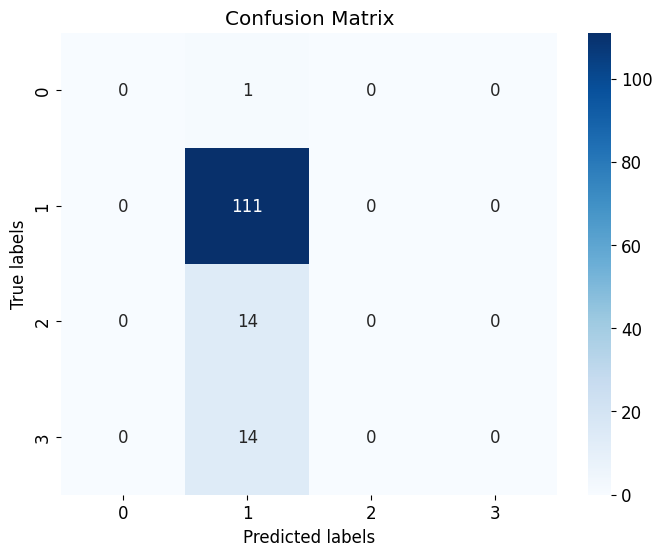

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming y_pred and y_test are your predicted and true labels, respectively
conf_matrix = confusion_matrix(y_test, y_pred)

# Plotting the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


# Increase model accuracy

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import MultinomialNB

# Initialize Naive Bayes classifier
nb_classifier = MultinomialNB()

# Perform 5-fold cross-validation
cv_scores = cross_val_score(nb_classifier, X_train_vectors, y_train, cv=5)

# Print the cross-validation scores
print("Cross-Validation Scores:", cv_scores)

# Calculate the mean cross-validation score
mean_cv_score = cv_scores.mean()
print("Mean Cross-Validation Score:", mean_cv_score)


Cross-Validation Scores: [0.77678571 0.77678571 0.76785714 0.76785714 0.77477477]
Mean Cross-Validation Score: 0.7728120978120978


The least populated class in y has only 1 members, which is less than n_splits=5.


#Apply RNN DeepLearning module

In [134]:
y_train.shape
X_train_vectors.shape
vocab_size = int(np.max(X_train_vectors) + 1)

In [84]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM

# Assuming X_train_vectors is your input data and y_train is your target data
# Create a Sequential model
model = Sequential()

# Add an Embedding layer
# Replace 100 with the dimensionality of your word vectors
model.add(Embedding(input_dim=vocab_size, output_dim=100, input_length=100))

# Add an LSTM layer
# You can adjust the number of units and other parameters as needed
model.add(LSTM(units=64))

# Add a Dense layer for classification
model.add(Dense(units=1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train_vectors, y_train, epochs=5, batch_size=32, validation_split=0.1)


Epoch 1/5
16/16 [==============================] - 6s 143ms/step - loss: 0.6815 - accuracy: 0.7535 - val_loss: 0.6746 - val_accuracy: 0.7857
Epoch 2/5
16/16 [==============================] - 1s 30ms/step - loss: 0.6693 - accuracy: 0.7714 - val_loss: 0.6743 - val_accuracy: 0.7857
Epoch 3/5
16/16 [==============================] - 0s 31ms/step - loss: 0.6576 - accuracy: 0.7714 - val_loss: 0.6720 - val_accuracy: 0.7857
Epoch 4/5
16/16 [==============================] - 0s 24ms/step - loss: 0.6539 - accuracy: 0.7714 - val_loss: 0.6683 - val_accuracy: 0.7857
Epoch 5/5
16/16 [==============================] - 0s 18ms/step - loss: 0.6373 - accuracy: 0.7634 - val_loss: 0.6721 - val_accuracy: 0.7321


#Test the model on test data

In [85]:
# Assuming your model has been trained and is named 'model'

# Evaluate the model on test data
loss, accuracy = model.evaluate(X_test_vectors, y_test)

# Print the test loss and accuracy
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)


5/5 [==============================] - 0s 11ms/step - loss: 0.6196 - accuracy: 0.7857
Test Loss: 0.6196423172950745
Test Accuracy: 0.7857142686843872
